## Exploratory Data Analysis
---

- #### Step 1: import the necessary python packages
- #### Step 2: import the dataset
- #### Step 3: find patterns in the data

In [1]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.express as px

In [2]:
data = pd.read_csv('diabetes_cleaned.csv')

In [3]:
data.head()

,encounter_id,patient_nbr,race,gender,age,weight,admission_type_id,discharge_disposition_id,admission_source_id,time_in_hospital,...,citoglipton,insulin,glyburide-metformin,glipizide-metformin,glimepiride-pioglitazone,metformin-rosiglitazone,metformin-pioglitazone,change,diabetesMed,readmitted
0,2278392,8222157,Caucasian,Female,[0-10),88.0,6,25,1,1,...,No,No,No,No,No,No,No,No,No,NO
1,149190,55629189,Caucasian,Female,[10-20),88.0,1,1,7,3,...,No,Up,No,No,No,No,No,Ch,Yes,>30
2,64410,86047875,AfricanAmerican,Female,[20-30),88.0,1,1,7,2,...,No,No,No,No,No,No,No,No,Yes,NO
3,500364,82442376,Caucasian,Male,[30-40),88.0,1,1,7,2,...,No,Up,No,No,No,No,No,Ch,Yes,NO
4,16680,42519267,Caucasian,Male,[40-50),88.0,1,1,7,1,...,No,Steady,No,No,No,No,No,Ch,Yes,NO


In [7]:
# changing the ranges to integer using the median of each range
age_dict = {'[50-60)': 55, '[80-90)': 85, '[40-50)': 45, '[70-80)': 75, '[60-70)': 65, '[30-40)': 35, '[0-10)': 5, '[90-100)': 95, '[10-20)':15, '[20-30)':25}

# Map age categories to integers
data['age'] = data['age'].replace(age_dict)

# Check weight values after replacing ranges with median value
print(print("Unique values after mapping:", data['age'].unique()))

Unique values after mapping: [ 5 15 25 35 45 55 65 75 85 95]
None


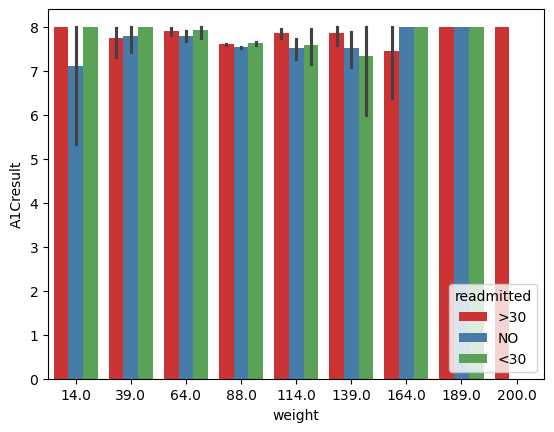

In [23]:
# plot two columns
plot = sns.barplot(x='weight', y='A1Cresult', data=data, hue='readmitted', palette='Set1')

# Save the plot as an image file
plt.savefig('weightvsA1Cbarplot.png', dpi=300)  # Save with high resolution

plt.show()

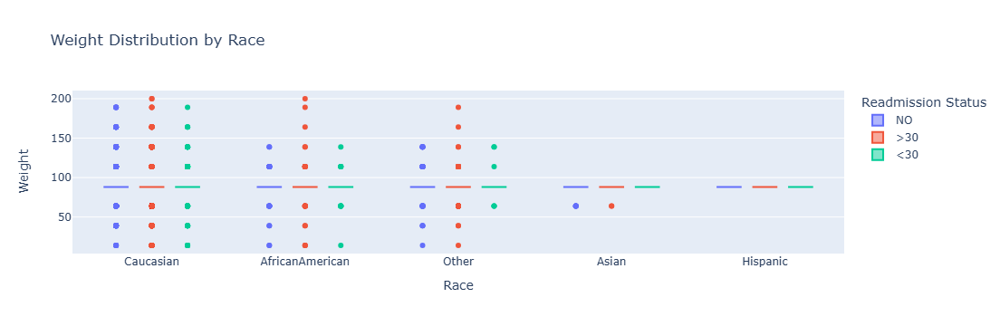

In [8]:
# Create the plot
fig = px.box(data, x='race', y='weight', color='readmitted', title='Weight Distribution by Race',
             labels={'weight': 'Weight', 'race': 'Race', 'readmitted': 'Readmission Status'})

# Save the plot as an image file
fig.write_image('weight_distribution_by_race.png', format='png', scale=2) 

# Show the plot
fig.show()

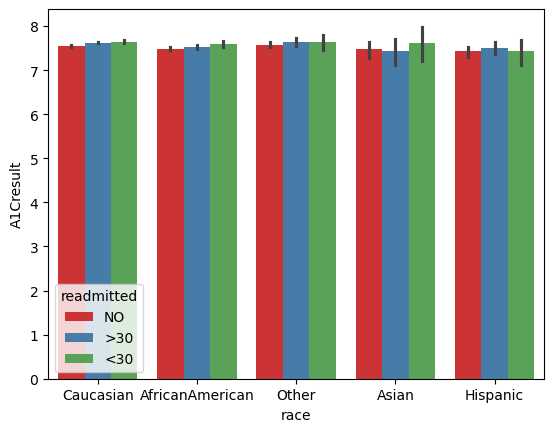

In [35]:
# plot two columns
plot = sns.barplot(x='race', y='A1Cresult', data=data, hue='readmitted', palette='Set1')

# Save the plot as an image file
plt.savefig('weightvsracebarplot.png', dpi=300)  # Save with high resolution

plt.show()

In [9]:
print(data['gender'].unique())

['Female' 'Male' 'Unknown/Invalid']


In [10]:
print(data['gender'].value_counts())

gender
Female             54708
Male               47055
Unknown/Invalid        3
Name: count, dtype: int64


In [11]:
# 3 rows of Unknown/Invalid is very small number and 3 rows can be dropped without impact
# Drop rows where 'gender' is 'Unknown/Invalid'
data = data[data['gender'] != 'Unknown/Invalid']

In [12]:
print(data['gender'].value_counts())

gender
Female    54708
Male      47055
Name: count, dtype: int64


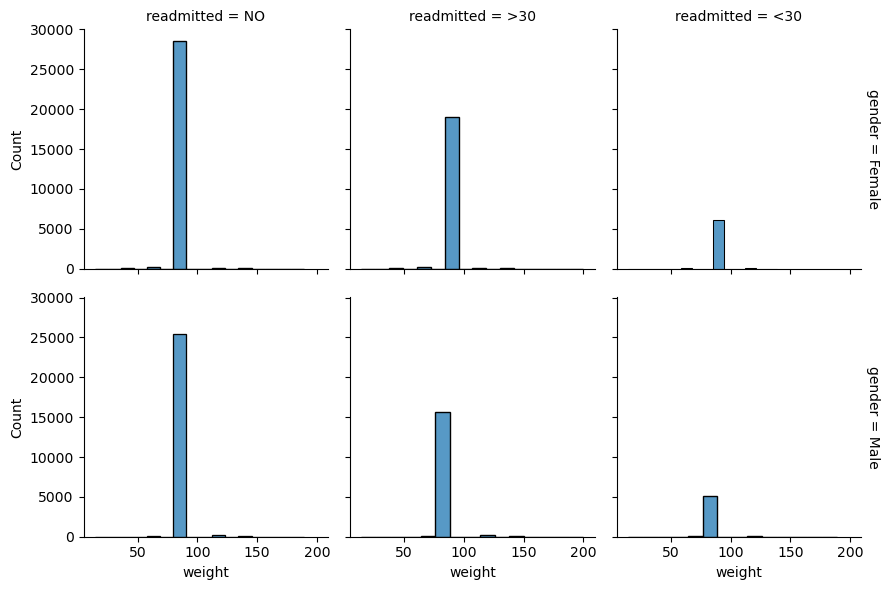

In [13]:
# facet grid looking at multiple factors
g = sns.FacetGrid(data, col='readmitted', row='gender', margin_titles=True)
g.map_dataframe(sns.histplot, x='weight', hue='gender', multiple='stack')

g.savefig('weightvsgender.png', dpi=300)

plt.show()

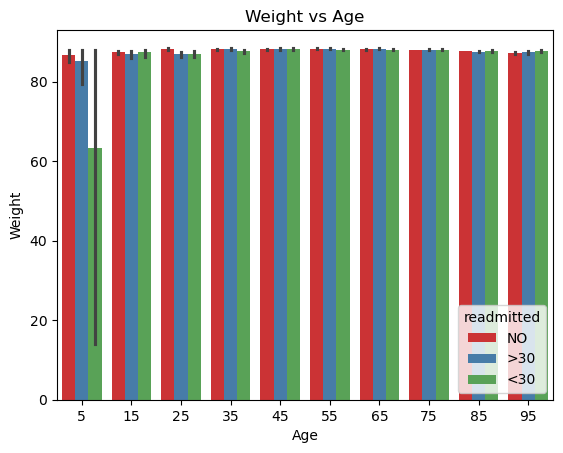

In [31]:
# Create bar plot
sns.barplot(x='age', y='weight', data=data, hue='readmitted', palette='Set1')

# Add labels and title
plt.xlabel('Age')
plt.ylabel('Weight')
plt.title('Weight vs Age')

plt.savefig('weightvsagebarplot.png', dpi=300)

# Show plot
plt.show()

In [15]:
print(data['readmitted'].value_counts())

readmitted
NO     54861
>30    35545
<30    11357
Name: count, dtype: int64


In [16]:
# merging readmitted<30 with readmitted>30 and explore the data after this
data['readmitted'] = data['readmitted'].replace('<30', '>30')
# replace '>30' with yes for patient readmitted status
data['readmitted'] = data['readmitted'].replace('>30', 'YES')

In [17]:
print(data['readmitted'].value_counts())

readmitted
NO     54861
YES    46902
Name: count, dtype: int64


In [18]:
data.columns.tolist()

['encounter_id',
 'patient_nbr',
 'race',
 'gender',
 'age',
 'weight',
 'admission_type_id',
 'discharge_disposition_id',
 'admission_source_id',
 'time_in_hospital',
 'payer_code',
 'medical_specialty',
 'num_lab_procedures',
 'num_procedures',
 'num_medications',
 'number_outpatient',
 'number_emergency',
 'number_inpatient',
 'diag_1',
 'diag_2',
 'diag_3',
 'number_diagnoses',
 'max_glu_serum',
 'A1Cresult',
 'metformin',
 'repaglinide',
 'nateglinide',
 'chlorpropamide',
 'glimepiride',
 'acetohexamide',
 'glipizide',
 'glyburide',
 'tolbutamide',
 'pioglitazone',
 'rosiglitazone',
 'acarbose',
 'miglitol',
 'troglitazone',
 'tolazamide',
 'examide',
 'citoglipton',
 'insulin',
 'glyburide-metformin',
 'glipizide-metformin',
 'glimepiride-pioglitazone',
 'metformin-rosiglitazone',
 'metformin-pioglitazone',
 'change',
 'diabetesMed',
 'readmitted']

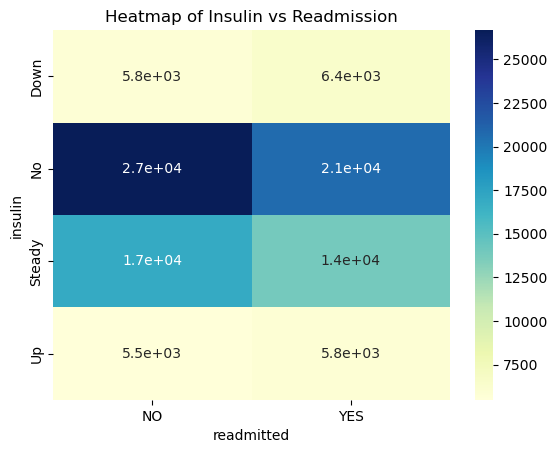

In [19]:
# look into correlations to select meaningful medication related features
insulin_heatmap = pd.crosstab(data['insulin'], data['readmitted'])
sns.heatmap(insulin_heatmap, annot=True, cmap='YlGnBu')
plt.title('Heatmap of Insulin vs Readmission')
plt.show()

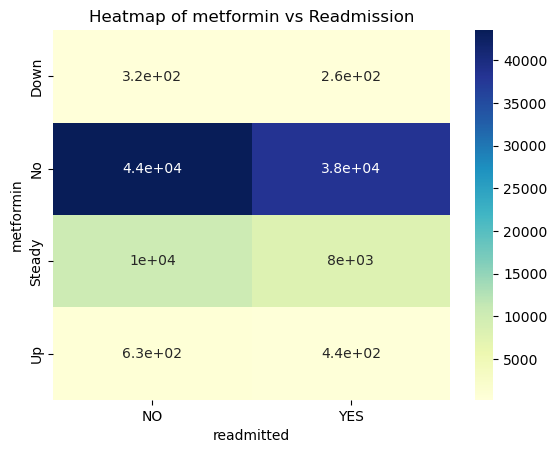

In [20]:
# look into correlations to select meaningful medication related features
metformin_heatmap = pd.crosstab(data['metformin'], data['readmitted'])
sns.heatmap(metformin_heatmap, annot=True, cmap='YlGnBu')
plt.title('Heatmap of metformin vs Readmission')
plt.show()

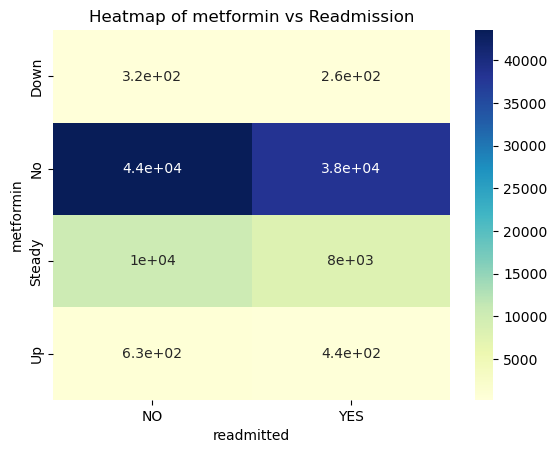

In [21]:
# look into correlations to select meaningful medication related features
metformin_heatmap = pd.crosstab(data['metformin'], data['readmitted'])
sns.heatmap(metformin_heatmap, annot=True, cmap='YlGnBu')
plt.title('Heatmap of metformin vs Readmission')
plt.show()

C:\Users\3sthe\AppData\Local\Temp\ipykernel_14472\1663216888.py:39: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.


C:\Users\3sthe\AppData\Local\Temp\ipykernel_14472\1663216888.py:39: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.


C:\Users\3sthe\AppData\Local\Temp\ipykernel_14472\1663216888.py:39: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.


C:\Users\3sthe\AppData\Local\Temp\ipykernel_14472\1663216888.py:39: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the sam

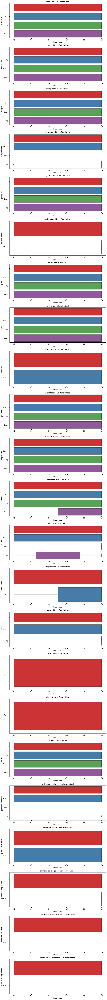

In [22]:
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd

# Convert target variable to numerical
data['readmitted'] = data['readmitted'].map({'YES': 1, 'NO': 0})

# List of medication columns
medication_columns = [
    'metformin',
    'repaglinide',
    'nateglinide',
    'chlorpropamide',
    'glimepiride',
    'acetohexamide',
    'glipizide',
    'glyburide',
    'tolbutamide',
    'pioglitazone',
    'rosiglitazone',
    'acarbose',
    'miglitol',
    'troglitazone',
    'tolazamide',
    'examide',
    'citoglipton',
    'insulin',
    'glyburide-metformin',
    'glipizide-metformin',
    'glimepiride-pioglitazone',
    'metformin-rosiglitazone',
    'metformin-pioglitazone'
]

# Create subplots for each medication
fig, axes = plt.subplots(len(medication_columns), 1, figsize=(10, 4 * len(medication_columns)))

for i, med_col in enumerate(medication_columns):
    sns.boxplot(x='readmitted', y=med_col, data=data, ax=axes[i], palette = 'Set1')
    axes[i].set_title(f'{med_col} vs Readmitted')
    axes[i].set_xlabel('Readmitted')
    axes[i].set_ylabel(med_col)

# Adjust layout
plt.tight_layout()
plt.show()

Primary Insight: 'examide'; 'acetohexamide'; 'citoglipton'; 'glimepiride-pioglitazone'; 'metformin-rosiglitazone' and 'metformin-pioglitazone' all hold a single value and can therefore be dropped as they contain meaningless information.

In [24]:
data = data.drop(columns=['examide', 'acetohexamide', 'citoglipton', 'glimepiride-pioglitazone', 'metformin-rosiglitazone', 'metformin-pioglitazone'])

In [25]:
data.columns.tolist()

['encounter_id',
 'patient_nbr',
 'race',
 'gender',
 'age',
 'weight',
 'admission_type_id',
 'discharge_disposition_id',
 'admission_source_id',
 'time_in_hospital',
 'payer_code',
 'medical_specialty',
 'num_lab_procedures',
 'num_procedures',
 'num_medications',
 'number_outpatient',
 'number_emergency',
 'number_inpatient',
 'diag_1',
 'diag_2',
 'diag_3',
 'number_diagnoses',
 'max_glu_serum',
 'A1Cresult',
 'metformin',
 'repaglinide',
 'nateglinide',
 'chlorpropamide',
 'glimepiride',
 'glipizide',
 'glyburide',
 'tolbutamide',
 'pioglitazone',
 'rosiglitazone',
 'acarbose',
 'miglitol',
 'troglitazone',
 'tolazamide',
 'insulin',
 'glyburide-metformin',
 'glipizide-metformin',
 'change',
 'diabetesMed',
 'readmitted']

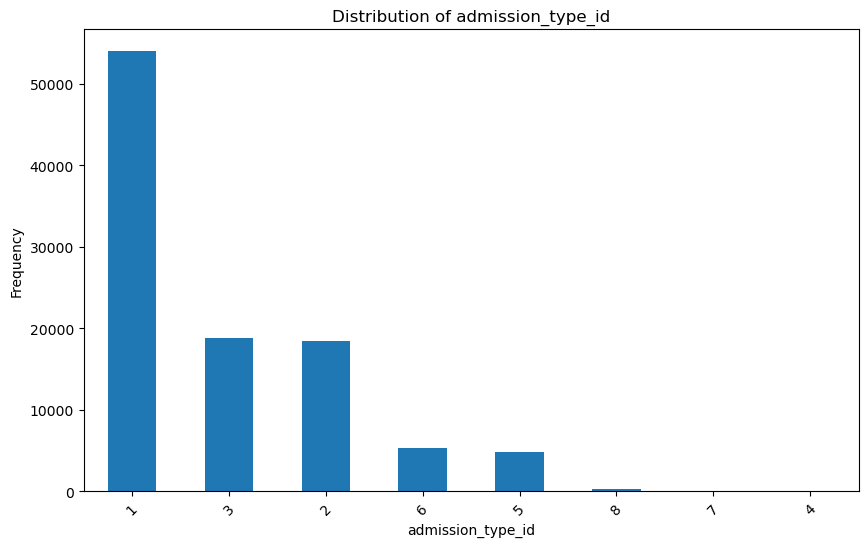

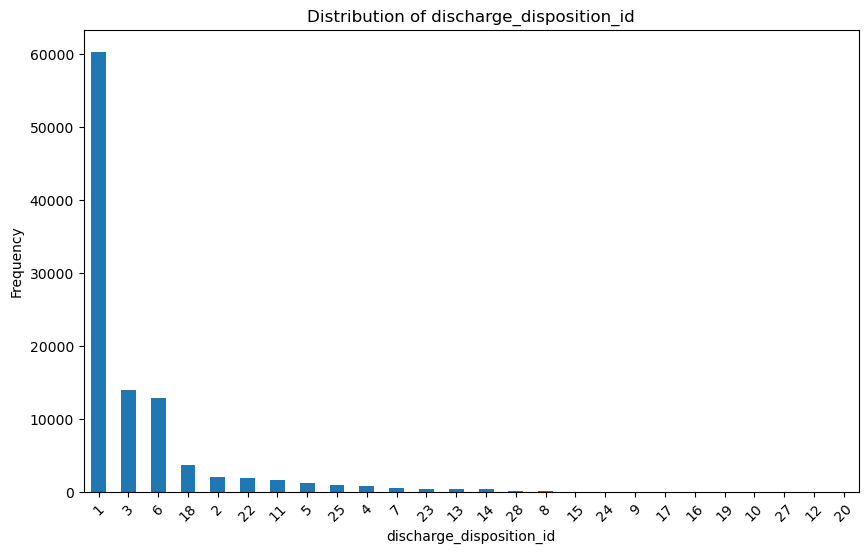

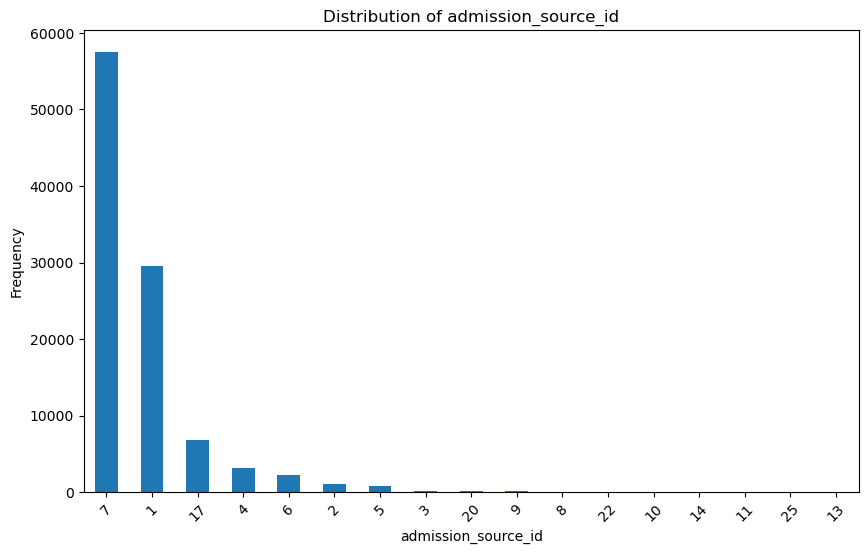

In [26]:
# Plot value counts for each column
for column in ['admission_type_id', 'discharge_disposition_id', 'admission_source_id']:
    plt.figure(figsize=(10, 6))
    data[column].value_counts().plot(kind='bar')
    plt.title(f'Distribution of {column}')
    plt.xlabel(column)
    plt.ylabel('Frequency')
    plt.xticks(rotation=45)
    plt.show()

Insight: 
High Frequency of 'admission_type_id': ID '1', 'admission_source_id': ID '7' and 'discharge_disposition_id': ID ‘1’: the most common category by a large margin. This could indicate a default or most typical outcome in the dataset.
Distribution: The distribution is highly skewed towards ID'7' and  ‘1’, with other IDs having relatively low frequencies. This suggests that the dataset is not evenly distributed across differen admission source andt discharge disposition IDs.
Potential Focus Area o investigate the conditions or criteria that lead to this outcome. Additionally, examining the less frequent IDs could provide insights into less common but potentially significant outcomes.

In [28]:
# looking into admission type
# ID 1 and 7 both relate to Surgery
data['admission_type_id'] = data['admission_type_id'].replace(7, 1)
# ID 8 refers to Other/Miscellaneous and can be replaced with most frequent ID
data['admission_type_id'] = data['admission_type_id'].replace(8, 1)
# ID 2 and 3 both relate to critical admission
data['admission_type_id'] = data['admission_type_id'].replace(2, 3)
# ID 4 holds no values and can therefore be replaced with the most frequent ID
data['admission_type_id'] = data['admission_type_id'].replace(4, 1)

In [29]:
print(data['admission_type_id'].value_counts())

admission_type_id
1    54339
3    37348
6     5291
5     4785
Name: count, dtype: int64


In [30]:
# looking into admission source
# ID 2, 5, 7, 8, 11, 12 source is of transfer type
transfer_map = {5:2, 7:2, 11:2, 12:2, 8:2}
data['admission_source_id'] = data['admission_source_id'].replace(transfer_map)

# ID 4, 16, 20, 23, source is of referral type
referral_map = {16:4, 20:4, 23:4}
data['admission_source_id'] = data['admission_source_id'].replace(referral_map)

# ID 3, 6, 17, 21 source is of type urgent
urgent_map = {3:17, 6:17, 21:17}
data['admission_source_id'] = data['admission_source_id'].replace(urgent_map)

# ID 9, 10, 13, 14, 25 are of type admission from another healthcare setting
# ID 11 is in the same group and already replaced with ID 2
healthcare_map = {9:2, 10:2, 13:2, 14:2, 25:2}
data['admission_source_id'] = data['admission_source_id'].replace(healthcare_map)

# ID 22 is other and can be replaced with most common ID
data['admission_source_id'] = data['admission_source_id'].replace(22, 2)

In [31]:
print(data['admission_source_id'].value_counts())

admission_source_id
2     59619
1     29564
17     9232
4      3348
Name: count, dtype: int64


In [32]:
# print(data['discharge_disposition_id'].value_counts())

In [33]:
# looking into discharge disposition
# ID 1, 9, 10, 2, 27, 28 refer to Home
home_map = {9:1, 2:9, 10:9, 27:9, 28:9}
data['discharge_disposition_id'] = data['discharge_disposition_id'].replace(home_map)

# ID 3, 4, 5, 6, 8, 14, 15, 16, 17, 18, 19, 21, 23, 25, 26, 27 refer to Facility/Center
facility_map = {4:3, 5:3, 6:3, 8:3, 14:3, 15:3, 16:3, 17:3, 18:3, 19:3, 21:3, 23:3, 25:3, 26:3, 27:3}
data['discharge_disposition_id'] = data['discharge_disposition_id'].replace(facility_map)

# ID 7, 11, 12, 13, 20 related to hospital
hospital_map = {7:11, 12:11, 13:11, 20:11}
data['discharge_disposition_id'] = data['discharge_disposition_id'].replace(hospital_map)

# ID 22 is Not Specified and can be replaced with most common ID
data['discharge_disposition_id'] = data['discharge_disposition_id'].replace(24, 1)

In [34]:
print(data['discharge_disposition_id'].value_counts())

discharge_disposition_id
1     60301
3     34523
11     2669
9      2278
22     1992
Name: count, dtype: int64


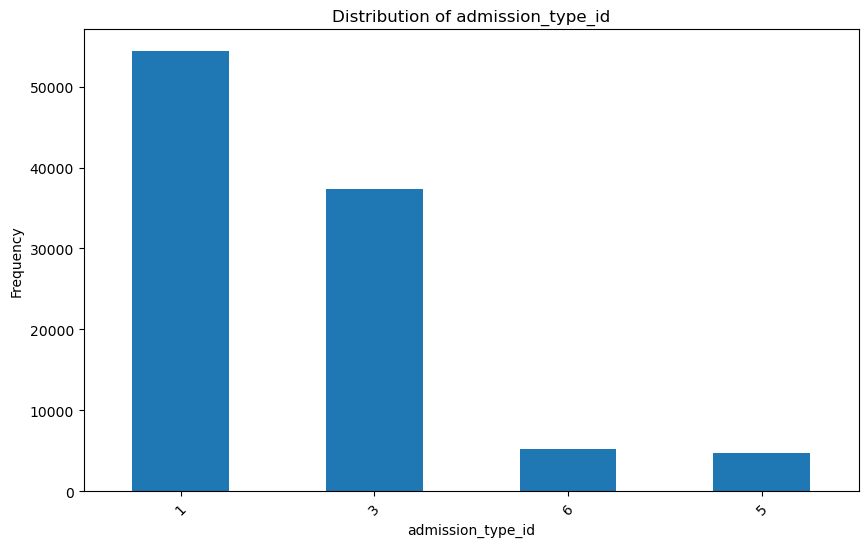

In [35]:
# Plot value counts for each column
for column in ['admission_type_id']:
    plt.figure(figsize=(10, 6))
    data[column].value_counts().plot(kind='bar')
    plt.title(f'Distribution of {column}')
    plt.xlabel(column)
    plt.ylabel('Frequency')
    plt.xticks(rotation=45)
    plt.savefig('admissionTypeID.png', dpi=300)
    plt.show()

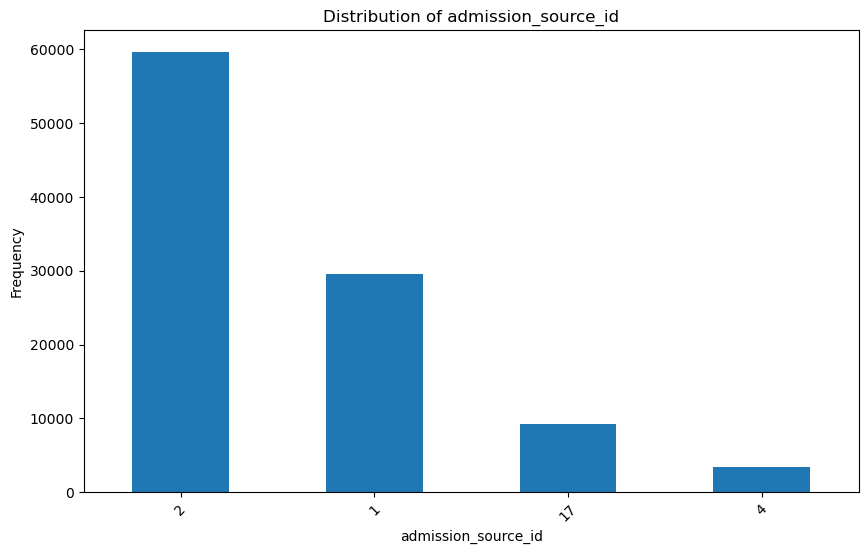

In [36]:
for column in ['admission_source_id']:
    plt.figure(figsize=(10, 6))
    data[column].value_counts().plot(kind='bar')
    plt.title(f'Distribution of {column}')
    plt.xlabel(column)
    plt.ylabel('Frequency')
    plt.xticks(rotation=45)
    plt.savefig('admissionSourceID.png', dpi=300)
    plt.show()

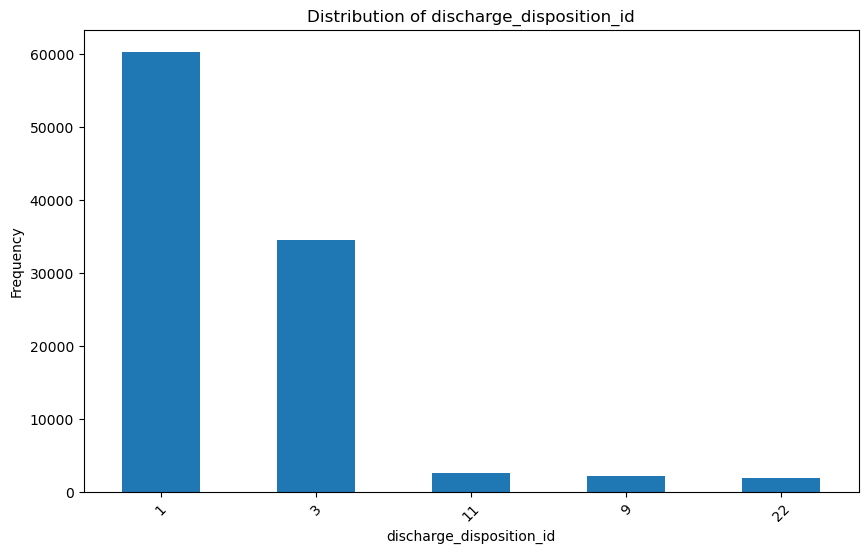

In [37]:
for column in ['discharge_disposition_id']:
    plt.figure(figsize=(10, 6))
    data[column].value_counts().plot(kind='bar')
    plt.title(f'Distribution of {column}')
    plt.xlabel(column)
    plt.ylabel('Frequency')
    plt.xticks(rotation=45)
    plt.savefig('dischargeID.png', dpi=300)
    plt.show()

In [38]:
data.columns.tolist()

['encounter_id',
 'patient_nbr',
 'race',
 'gender',
 'age',
 'weight',
 'admission_type_id',
 'discharge_disposition_id',
 'admission_source_id',
 'time_in_hospital',
 'payer_code',
 'medical_specialty',
 'num_lab_procedures',
 'num_procedures',
 'num_medications',
 'number_outpatient',
 'number_emergency',
 'number_inpatient',
 'diag_1',
 'diag_2',
 'diag_3',
 'number_diagnoses',
 'max_glu_serum',
 'A1Cresult',
 'metformin',
 'repaglinide',
 'nateglinide',
 'chlorpropamide',
 'glimepiride',
 'glipizide',
 'glyburide',
 'tolbutamide',
 'pioglitazone',
 'rosiglitazone',
 'acarbose',
 'miglitol',
 'troglitazone',
 'tolazamide',
 'insulin',
 'glyburide-metformin',
 'glipizide-metformin',
 'change',
 'diabetesMed',
 'readmitted']

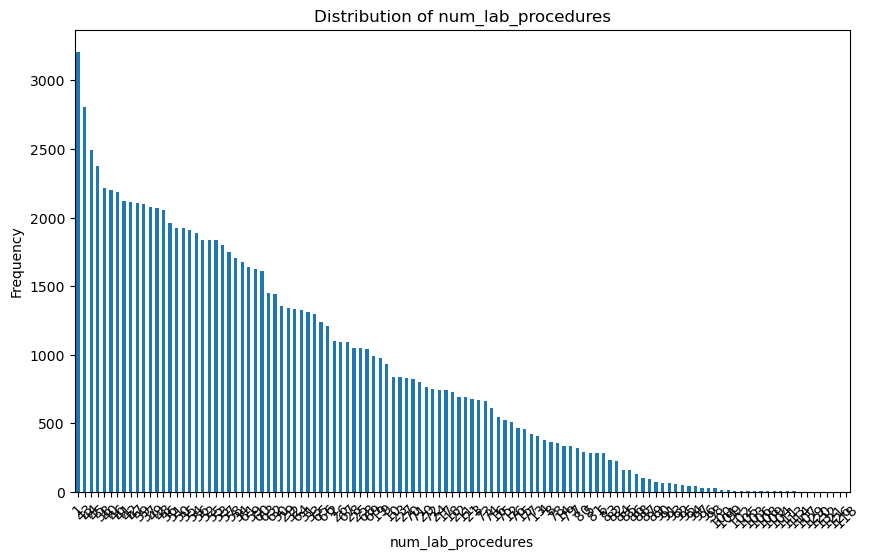

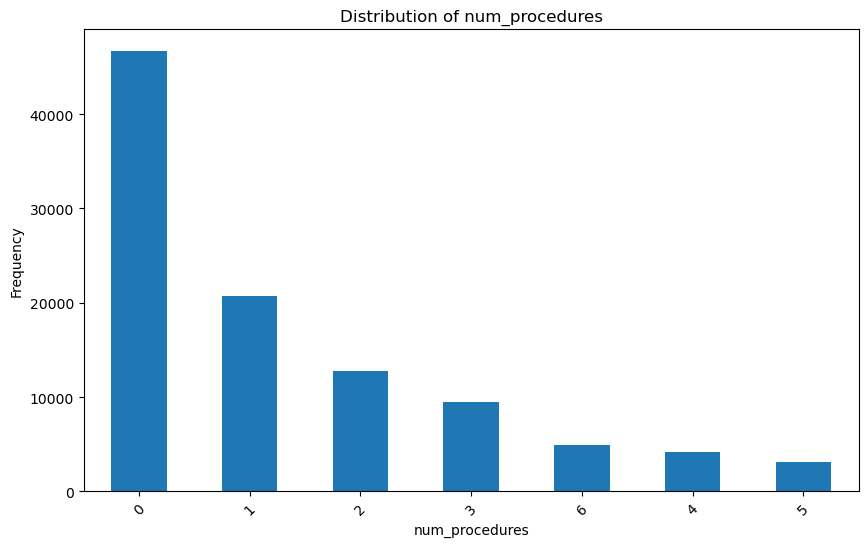

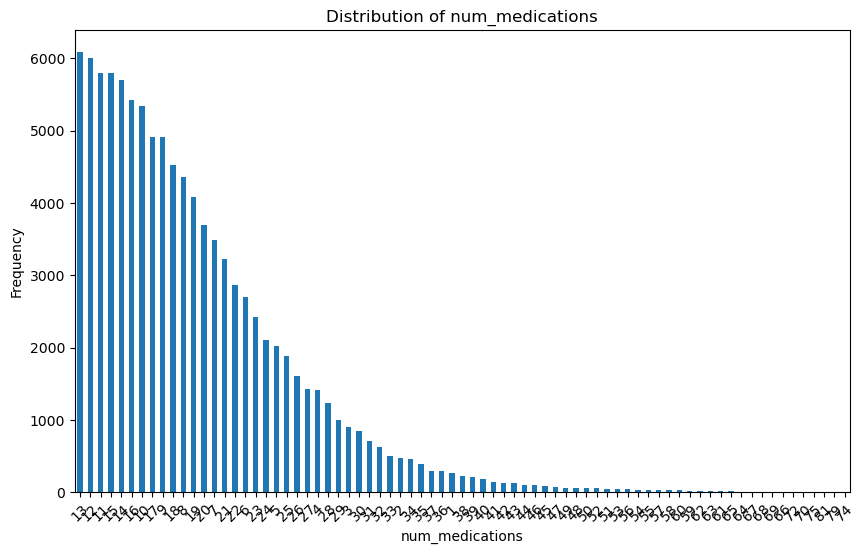

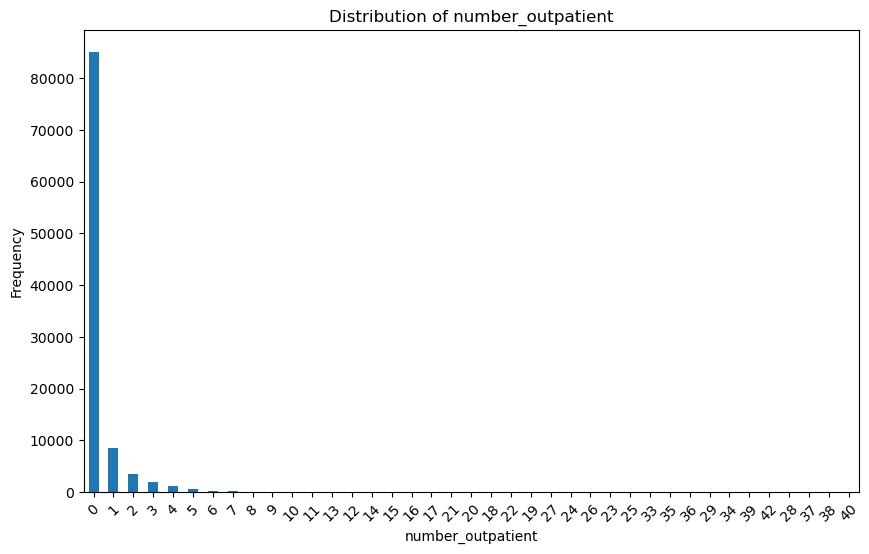

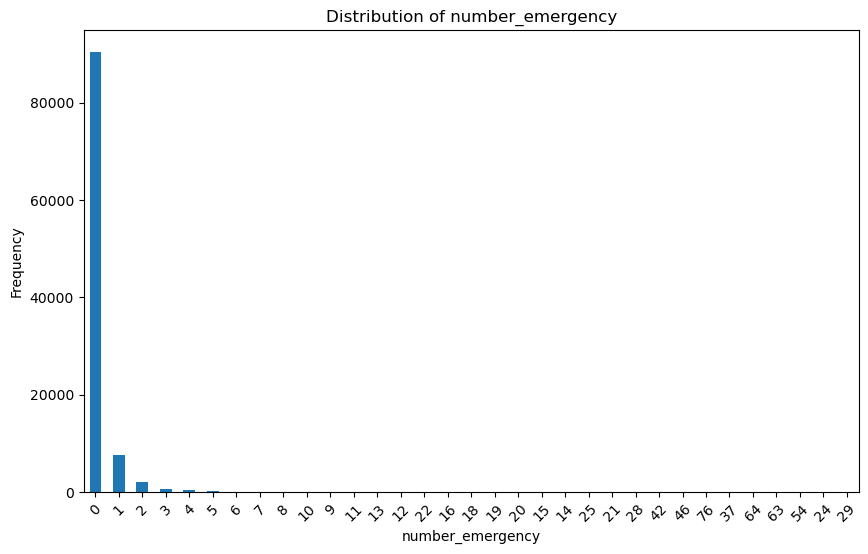

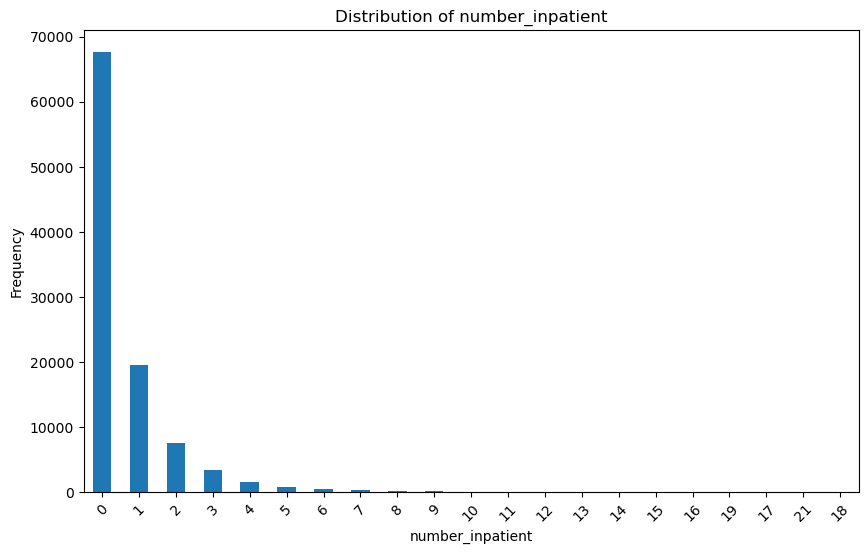

In [39]:
# looking into procedures columns
# Plot value counts for each column
for column in [
    'num_lab_procedures',
    'num_procedures',
    'num_medications',
    'number_outpatient',
    'number_emergency',
    'number_inpatient',]:
    plt.figure(figsize=(10, 6))
    data[column].value_counts().plot(kind='bar')
    plt.title(f'Distribution of {column}')
    plt.xlabel(column)
    plt.ylabel('Frequency')
    plt.xticks(rotation=45)
    plt.show()

High Frequency at Zero: The highest bar corresponds to 0 on the horizontal axis, indicating that the majority of patients have not been admitted to inpatient or outpatient care nor for procedures and emergency purposes.

Sharp Decrease: There is a sharp decrease in frequency as the num_procedures, number_outpatient, number_emergency and number_inpatient increases. This suggests that fewer patients are admitted multiple times.

Low Frequencies Beyond 3: The frequencies for values above 3 are very low, indicating that repeated emergency, outpatient and inpatient admissions are rare.

Insights:
Skewed Distribution: The distribution is heavily skewed towards zero, showing that most patients do not require frequent procedures, emergency, outpatient and inpatient care.
Healthcare Utilization: This could imply that the healthcare system is effective in treating patients without the need for repeated admissions, or it could indicate that only a small subset of patients require frequent care.

are.
Next Steps:
Further Analysis: It might be useful to investigate the characteristics of patients who have higher number_inpatient values. Are there common factors such as age, underlying conditions, or other demographics?
Comparative Analysis: Compare this distribution with other variables to see if there are any correlations or patterns.

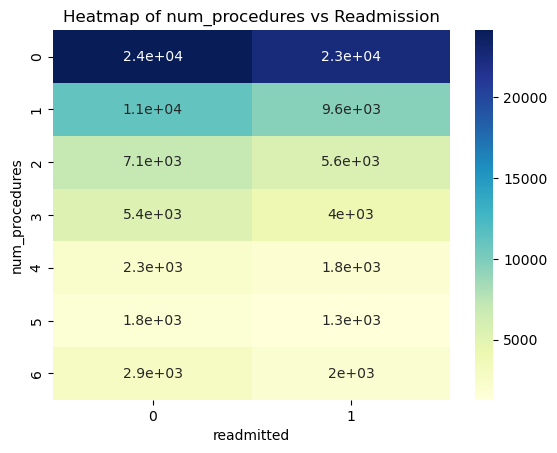

In [45]:
# look into correlations to select meaningful admission procedure related features
procedure_heatmap = pd.crosstab(data['num_procedures'], data['readmitted'])
sns.heatmap(procedure_heatmap, annot=True, cmap='YlGnBu')
plt.title('Heatmap of num_procedures vs Readmission')
plt.show()

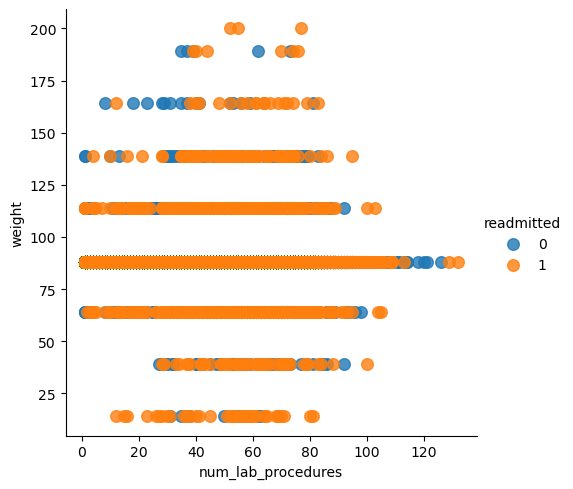

In [46]:
# plot two columns
sns.lmplot(x='num_lab_procedures', y='weight', data=data, hue='readmitted', fit_reg=False, scatter_kws={"s": 70})
plt.savefig('weightvsnum_lab_procedures.png', dpi=300)
plt.show()

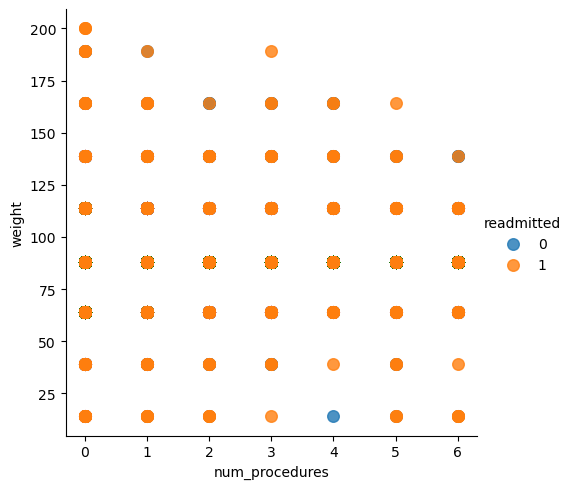

In [47]:
# plot two columns
sns.lmplot(x='num_procedures', y='weight', data=data, hue='readmitted', fit_reg=False, scatter_kws={"s": 70})
plt.savefig('weightvsnum_procedures.png', dpi=300)
plt.show()

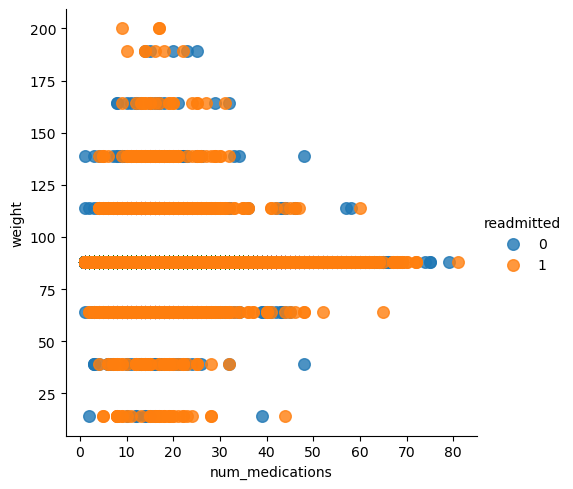

In [48]:
# plot two columns
sns.lmplot(x='num_medications', y='weight', data=data, hue='readmitted', fit_reg=False, scatter_kws={"s": 70})
plt.savefig('weightvsnum_medications.png', dpi=300)
plt.show()

Key Observations:
Spread of Data Points: The data points are spread across the graph, showing a distribution of weights against the number oflab procedures, procedures and  medications (num_medications).

Weight Distribution: The weight values range from 50 to over 200, similar to the previous plots. There is no clear trend or pattern showing a relationship between weight and num_lab_procedures, num_procedures and num_medications.

Readmission Categories: The data points are colored to represent two categories: readmitted (0) and not readmitted (1). Both categories seem to be distributed similarly across the plot, with no obvious separation between them.

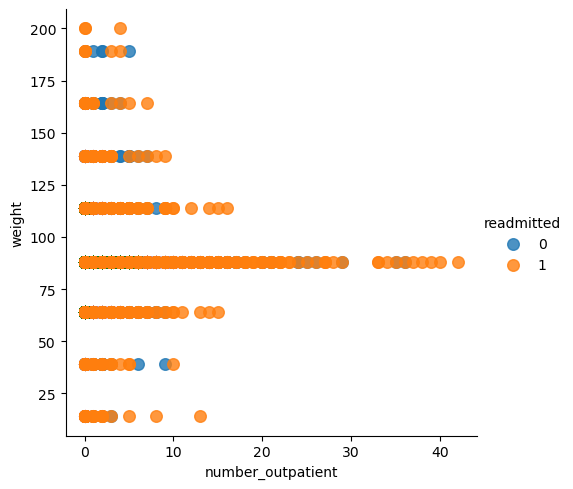

In [52]:
# plot two columns
sns.lmplot(x='number_outpatient', y='weight', data=data, hue='readmitted', fit_reg=False, scatter_kws={"s": 70})
plt.savefig('weightvsnumber_outpatient.png', dpi=300)
plt.show()

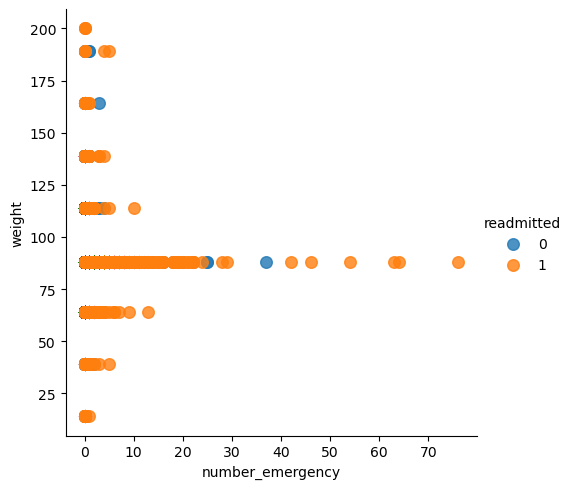

In [53]:
# plot two columns
sns.lmplot(x='number_emergency', y='weight', data=data, hue='readmitted', fit_reg=False, scatter_kws={"s": 70})
plt.savefig('weightvsnumber_emergency.png', dpi=300)
plt.show()

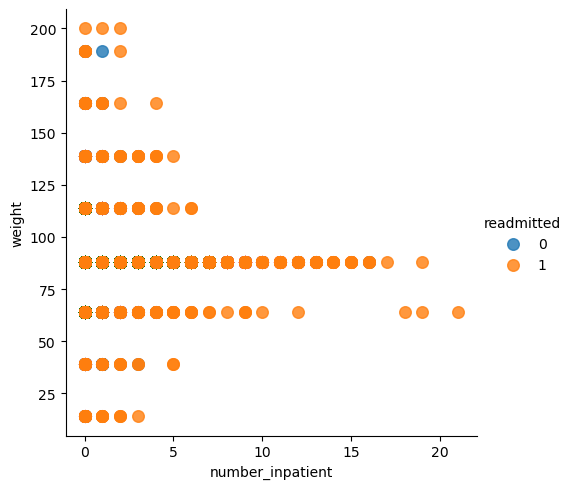

In [54]:
# plot two columns
sns.lmplot(x='number_inpatient', y='weight', data=data, hue='readmitted', fit_reg=False, scatter_kws={"s": 70})
plt.savefig('weightvsnumber_inpatient.png', dpi=300)
plt.show()

Key Observations:
Clustered Data Points: Most data points are clustered around the lower end of the number_outpatient, number_emergency, number_inpatient axis, indicating that the majority of patients have a low number of outpatient, emergency and inpatient visits.

Weight Distribution: The weight values range from 50 to over 200, but there is no clear trend or pattern showing a relationship between weight and number_inpatient.

Readmission Categories: The data points are colored to represent two categories: readmitted (0) and not readmitted (1). Both categories seem to be distributed similarly across the plot, with no obvious separation between them.

Insights:
No Clear Correlation: There doesn’t appear to be a strong correlation between weight and number_inpatient based on the scatter plot. This suggests that weight may not be a significant factor in predicting the number of inpatient visits.

Readmission Status: The similar distribution of readmitted and not readmitted categories indicates that readmission status might not be strongly influenced by either weight or number_inpatient.